# EDA on Wine Quality Dataset and Wine Review Dataset

References:
- https://www.digitalocean.com/community/tutorials/exploratory-data-analysis-python  
- https://towardsdatascience.com/exploratory-data-analysis-in-python-a-step-by-step-process-d0dfa6bf94ee  
- https://manuelenolli.github.io/wine-enthusiast-analysis/
- https://www.winemag.com/our-buying-guide-and-blind-tasting-process/

## 1) Wine Quality Dataset
 
Source: https://archive.ics.uci.edu/ml/datasets/wine+quality  
Citation: P. Cortez, A. Cerdeira, F. Almeida, T. Matos and J. Reis. Modeling wine preferences by data mining from physicochemical properties. In Decision Support Systems, Elsevier, 47(4):547-553, 2009.

Dummy Variable(Red = 1, White = 0)is used to put separated red wine dataset and white wine dataset together.

The two datasets are related to red and white variants of the Portuguese "Vinho Verde" wine.
Due to privacy and logistic issues, only physicochemical (inputs) and sensory (the output) variables are available (e.g. there is no data about grape types, wine brand, wine selling price, etc.).

In [1]:
# Importing Libraries
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from matplotlib import rcParams
import os
import seaborn as sns

import plotly.express as px
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# styling
plt.style.use("ggplot")
rcParams['figure.figsize'] = (12, 6)

In [2]:
wines = pd.read_csv('datasets/winequality-all.csv')
wines.head(10)  # breifly check the data

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,1,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,1,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,1,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,1,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
5,1,7.4,0.66,0.00,1.8,0.075,13.0,40.0,0.9978,3.51,0.56,9.4,5
6,1,7.9,0.60,0.06,1.6,0.069,15.0,59.0,0.9964,3.30,0.46,9.4,5
7,1,7.3,0.65,0.00,1.2,0.065,15.0,21.0,0.9946,3.39,0.47,10.0,7
8,1,7.8,0.58,0.02,2.0,0.073,9.0,18.0,0.9968,3.36,0.57,9.5,7
9,1,7.5,0.50,0.36,6.1,0.071,17.0,102.0,0.9978,3.35,0.80,10.5,5


### Information about data

There is 11 inputs variables and 1 output variable('quality'), and 1 dummy variable('type').

In [3]:
# Basic information about data 
wines.info()
wines.describe()  #decriptive statistics

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   type                  6497 non-null   int64  
 1   fixed acidity         6497 non-null   float64
 2   volatile acidity      6497 non-null   float64
 3   citric acid           6497 non-null   float64
 4   residual sugar        6497 non-null   float64
 5   chlorides             6497 non-null   float64
 6   free sulfur dioxide   6497 non-null   float64
 7   total sulfur dioxide  6497 non-null   float64
 8   density               6497 non-null   float64
 9   pH                    6497 non-null   float64
 10  sulphates             6497 non-null   float64
 11  alcohol               6497 non-null   float64
 12  quality               6497 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 660.0 KB


,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,0.246114,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,5.818378
std,0.430779,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.873255
min,0.000000,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,0.000000,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,5.000000
50%,0.000000,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,6.000000
75%,0.000000,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,6.000000
max,1.000000,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000


In [4]:
# Duplicate values
wines.duplicated().sum()

# Dropping duplicated and na values 
wines = wines.drop_duplicates()
wines = wines.dropna()

# Descriptive statistics after cleaning
wines.describe()

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000,5320.000000
mean,0.255451,7.215179,0.344130,0.318494,5.048477,0.056690,30.036654,114.109023,0.994535,3.224664,0.533357,10.549241,5.795677
std,0.436155,1.319671,0.168248,0.147157,4.500180,0.036863,17.805045,56.774223,0.002966,0.160379,0.149743,1.185933,0.879772
min,0.000000,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,3.000000
25%,0.000000,6.400000,0.230000,0.240000,1.800000,0.038000,16.000000,74.000000,0.992200,3.110000,0.430000,9.500000,5.000000
50%,0.000000,7.000000,0.300000,0.310000,2.700000,0.047000,28.000000,116.000000,0.994650,3.210000,0.510000,10.400000,6.000000
75%,1.000000,7.700000,0.410000,0.400000,7.500000,0.066000,41.000000,153.250000,0.996770,3.330000,0.600000,11.400000,6.000000
max,1.000000,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,9.000000


In [5]:
# filter the data based on type for further use
red = wines[wines['type']==0]
white = wines[wines['type']==1]

In [6]:
# Percentage of red and white wines distribution
wines.type.value_counts(normalize=True)

0    0.744549
1    0.255451
Name: type, dtype: float64

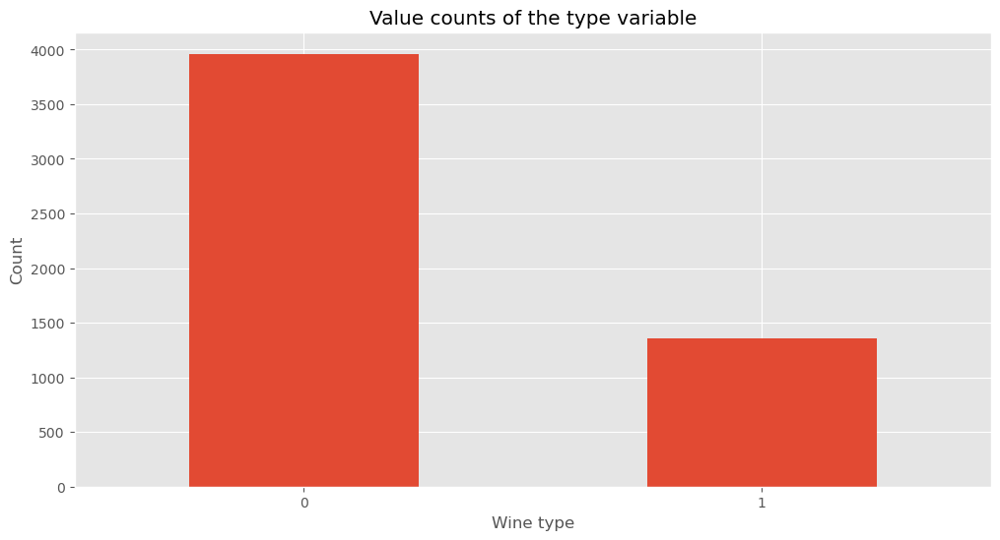

In [7]:
# Plot the distribution of wine types (Red = 0, White = 1)
wines.type.value_counts().plot(kind="bar")
plt.title("Value counts of the type variable")
plt.xlabel("Wine type")
plt.xticks(rotation=0)
plt.ylabel("Count")
plt.show()

In [8]:
qualityDistribution = px.histogram(wines, x="quality", title = "Distribution of Quality", height=500)
qualityDistribution.update_xaxes(title="Quality", dtick=1)
qualityDistribution.update_yaxes(title="Count")

### Relationship between variables

With concentrating on the output variable, 'quality', we can see that the 'alcohol' has a relatively high positive correlation with the 'quality', and the 'density' has a negative correlation with the 'quality'. 
We will look for the causality in further research by using simple OLS in preliminary study. 

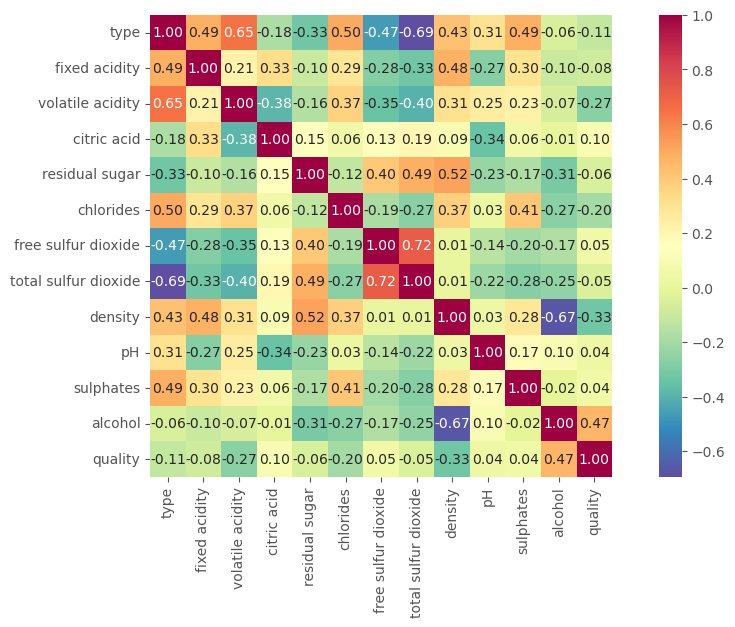

In [9]:
# Correlation heatmap
hm = sns.heatmap(wines.corr(), cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size':10}, yticklabels=wines.columns, 
                 xticklabels=wines.columns,cmap="Spectral_r")
plt.show()

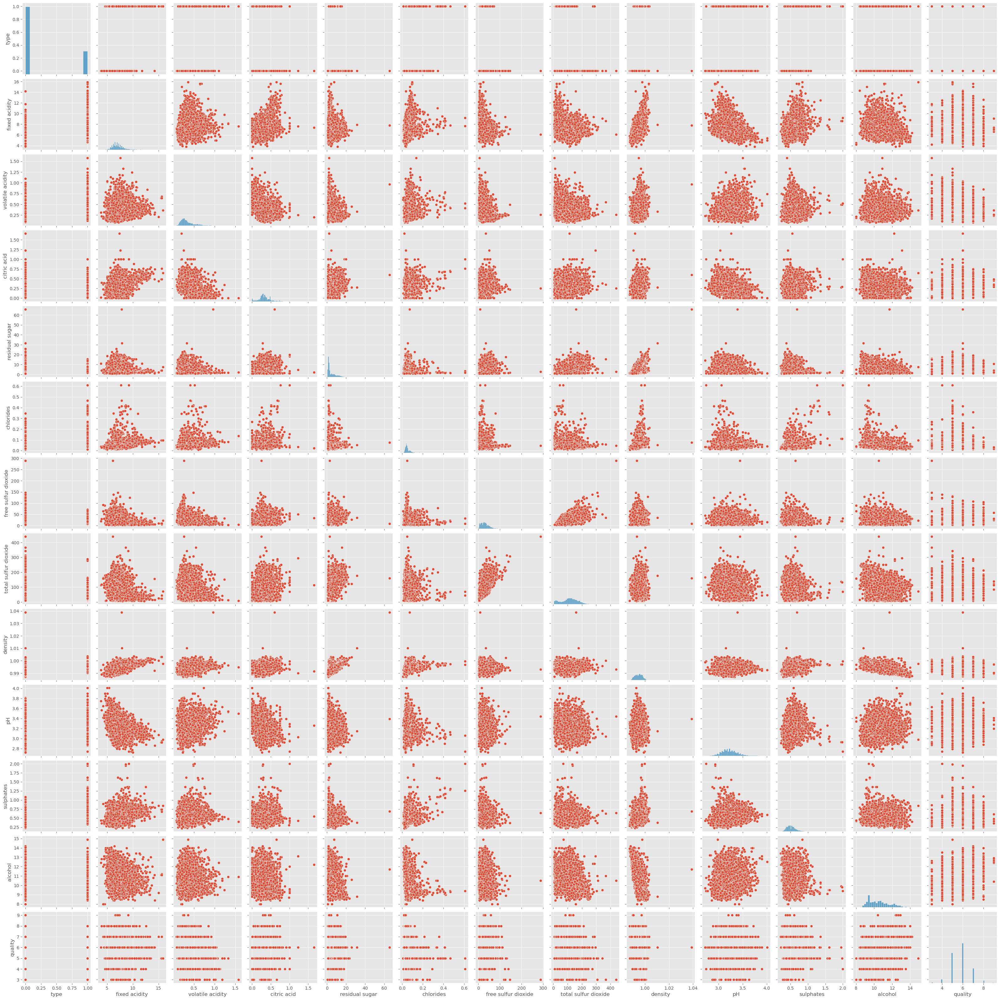

In [10]:
# Relationships between variables
sns.pairplot(wines)

## 2) Wine Reviews Dataset

Source: https://www.kaggle.com/datasets/zynicide/wine-reviews  
The data was scraped from http://www.winemag.com/?s=&drink_type=wine during 2017. 


**Data Description** 
- ```country```: the country of origin of wine
- ```description```: a few sentences from a sommelier describing the wine's taste, smell, look, feel, etc.
- ```designation```: the vineyard within the winery where the grapes that made the wine are from
- ```points```: the number of points WineEnthusiast rated the wine on a scale of 1-100 (though they say they only post reviews for wines that score >=80)
- ```price```: the cost for a bottle of the wine
- ```province```: the province or state that the wine is from
- ```region_1```: the wine growing area in a province or state (ie Napa)
- ```region_2```: sometimes there are more specific regions specified within a wine growing area (ie Rutherford inside the Napa Valley), but this value can sometimes be blank
- ```taster_name```: name of the person who tasted and reviewed the wine
- ```taster_photo```: url of the taster's photo
- ```taster_twitter_handle```: Twitter handle for the person who tasted and reviewed the wine
- ```title```: the title of the wine review
- ```variety```: the type of grapes used to make the wine (ie Pinot Noir)
- ```vintage```: the vintage of the wine
- ```winery```: the winery that made the wine

In [11]:
wines2 = pd.read_csv('datasets/winemag-data-130k-v2.csv')
wines2.sample(5)  # breifly check the data

,Unnamed: 0,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
57821,57821,Italy,This Barolo opens with a ruby-garnet color and...,NaN,93,NaN,Piedmont,Barolo,NaN,NaN,NaN,Massimo Penna 2007 Barolo,Nebbiolo,Massimo Penna
27742,27742,France,There's a kick of dry tannin behind this other...,NaN,85,NaN,Burgundy,Bourgogne,NaN,Roger Voss,@vossroger,Domaine Poulleau Père et Fils 2011 Bourgogne,Pinot Noir,Domaine Poulleau Père et Fils
98839,98839,Uruguay,"Spicy oak aromas suggest sandalwood, while thi...",Primo,91,50.0,Uruguay,NaN,NaN,Michael Schachner,@wineschach,Pizzorno 2011 Primo Red (Uruguay),Red Blend,Pizzorno
103898,103898,US,"A proprietary blend of 36% Cabernet Sauvignon,...",Contrarian,91,135.0,California,Napa Valley,Napa,Virginie Boone,@vboone,Blackbird Vineyards 2013 Contrarian Red (Napa ...,Bordeaux-style Red Blend,Blackbird Vineyards
59113,59113,US,The Red Queen bottling is Evening Land's most ...,Seven Springs Vineyard Red Queen,92,75.0,Oregon,Eola-Amity Hills,Willamette Valley,Paul Gregutt,@paulgwine,Evening Land 2010 Seven Springs Vineyard Red Q...,Pinot Noir,Evening Land


In [12]:
wines2 = wines2.drop('Unnamed: 0', axis=1)  # drop first index column
wines2 = wines2.drop('region_2', axis =1)  # drop 'region_2' column. 
# 'region_2' is indicating more specific regions but most of the times, it is blanked.

In [13]:
wines2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129971 entries, 0 to 129970
Data columns (total 12 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   country                129908 non-null  object 
 1   description            129971 non-null  object 
 2   designation            92506 non-null   object 
 3   points                 129971 non-null  int64  
 4   price                  120975 non-null  float64
 5   province               129908 non-null  object 
 6   region_1               108724 non-null  object 
 7   taster_name            103727 non-null  object 
 8   taster_twitter_handle  98758 non-null   object 
 9   title                  129971 non-null  object 
 10  variety                129970 non-null  object 
 11  winery                 129971 non-null  object 
dtypes: float64(1), int64(1), object(10)
memory usage: 11.9+ MB


### Distribution of Quality (Points)

minimum: 80
maximum: 100

We will use 6 categories used in WineEnthusiast to group the wine with their points. ``pointsDescription`` is added to the column to contain the description of the points.

- **80–82: ACCEPTABLE** Can be employed in casual, less-critical circumstances
- **83–86: GOOD** Suitable for everyday consumption; often good value
- **87–89: VERY GOOD** Often good value; well recommended
- **90–93: EXCELLENT** Highly recommended
- **94–97: SUPERB** A great achievement
- **98–100: CLASSIC** The pinnacle of quality

From the histogram, the wines in the middle range quality, **Good** and **Very good** are most common, followed by **Excellent**.

In [14]:
#Create new column, pointsDescription
def addPointsDescription(points):
    if points < 83:
        val = 'Acceptable'
    elif points < 87:
        val = 'Good'
    elif points < 90:
        val = 'Very good'
    elif points <93:
        val = 'Excellent'
    elif points <97:
        val = 'Superb'
    else:
        val = 'Classic'

    return val

#Create new column with points description
wines2['pointsDescription'] = wines2['points'].map(addPointsDescription)

In [15]:
#Histogram of points description
pointDistribution = px.histogram(wines2, x='points', color='pointsDescription', title='Distribution of Quality(points)', height=500,
 category_orders=dict(pointsDescription=['Classic', 'Superb', 'Excellent', 'Very good', 'Good','Acceptable']), 
                  labels={
                     "pointsDescription": "Point Description"
                 },
                 color_discrete_map = {'Classic':'#903f5c','Superb':'#006179','Excellent':'#008377','Very good':'#09a259', 'Good':'#90b827', 'Acceptable':'#ffbf00'}

)
#Update axis
pointDistribution.update_xaxes(title='Point',tickmode='linear')
pointDistribution.update_yaxes(title='Count')

pointDistribution.show()

### Relationship between quality and prices

Since most of the variables in this dataset are categorical, we will see the correlation between quality and prices, numerical variables only.

We can see a rough positive relationship between price and points, but we will treat this on the preliminary analysis in detail. 

<AxesSubplot:xlabel='price', ylabel='points'>

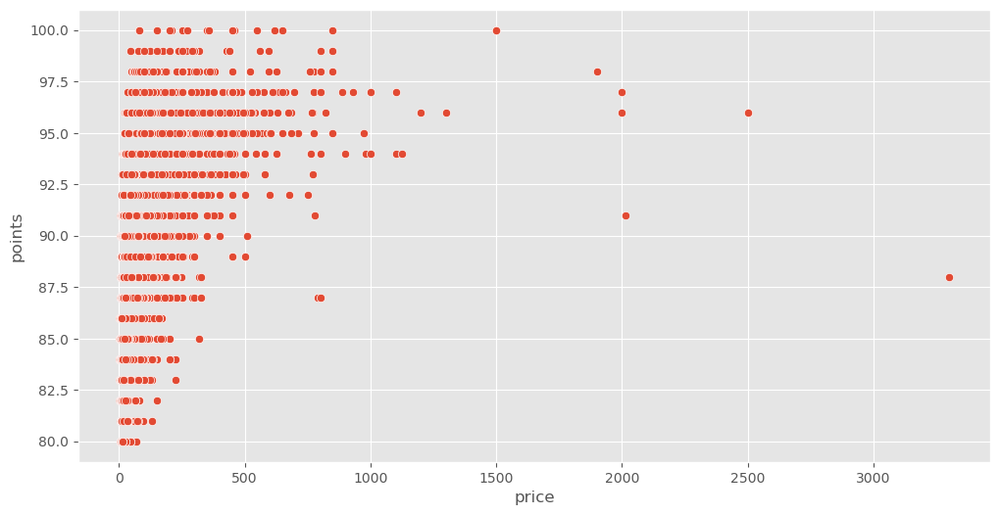

In [16]:
sns.scatterplot(x='price', y='points', data=wines2)

In [17]:
corr = wines2['points'].corr(wines2['price'])
corr

0.4161667418606225

Similar with the quality distribution, I will add ``priceDescription`` to categorize the price of wines.

- **0-20 USD: Low**
- **21-50 USD: Medium**
- **51-100 USD: Expensive**
- **100+ USD: Luxury**

In [18]:
#Function to create a new column with the price range
def addPriceDescription(price):
    if price <= 20:
        val = 'Low'
    elif price <= 50:
        val = 'Medium'
    elif price <= 100:
        val = 'Expensive'
    else:
        val = 'Luxury'
    return val

wines2['priceDescription'] = wines2['price'].map(addPriceDescription)

In [19]:
averagepricePoint = px.histogram(wines2,x='points', color='priceDescription', barmode='stack', barnorm='percent',
 category_orders=dict(priceDescription=['Low', 'Medium', 'Expensive', 'Luxury']), title='Price distribution and Quality(points)', labels={
                     "priceDescription": "Price Description"
                 }, color_discrete_sequence=px.colors.sequential.Teal
                 )

averagepricePoint.update_xaxes(title='Point', dtick=1)
averagepricePoint.update_yaxes(title='Count(%)')

averagepricePoint.show()

### Distribution of wines across the world

To see the distribution of the wines across the continents and countries, new column named `continent` is added.

In [20]:
print(wines2['country'].unique())

['Italy' 'Portugal' 'US' 'Spain' 'France' 'Germany' 'Argentina' 'Chile'
 'Australia' 'Austria' 'South Africa' 'New Zealand' 'Israel' 'Hungary'
 'Greece' 'Romania' 'Mexico' 'Canada' nan 'Turkey' 'Czech Republic'
 'Slovenia' 'Luxembourg' 'Croatia' 'Georgia' 'Uruguay' 'England' 'Lebanon'
 'Serbia' 'Brazil' 'Moldova' 'Morocco' 'Peru' 'India' 'Bulgaria' 'Cyprus'
 'Armenia' 'Switzerland' 'Bosnia and Herzegovina' 'Ukraine' 'Slovakia'
 'Macedonia' 'China' 'Egypt']


In [21]:
#Continent list
europe = ['Austria', 'Bosnia and Herzegovina','Bulgaria','Croatia','Cyprus','Czech Republic','England', 'France','Germany','Greece','Italy','Luxembourg','Portugal','Hungary', 'Macedonia', 'Moldova', 'Romania', 'Serbia', 'Slovakia', 'Slovenia', 'Spain', 'Switzerland', 'Turkey', 'Ukraine']
northAmerica = ['Canada','US','Mexico']

# Define a function to distinguish continent for each country
def classifyContinent(row):
    if row['country'] in europe:
        val = 'Europe'
    elif row['country'] in northAmerica:
        val = "North America"
    else:
        val = 'Other'
    return val

# Add continent varaible to each row
wines2['continent'] = wines2.apply(classifyContinent, 1)

In [22]:
wines2.sample()

,country,description,designation,points,price,province,region_1,taster_name,taster_twitter_handle,title,variety,winery,pointsDescription,priceDescription,continent
10023,France,In the dry style characteristic of the Lelarge...,Premier Cru Brut,91,NaN,Champagne,Champagne,Roger Voss,@vossroger,Lelarge-Pugeot NV Premier Cru Brut (Champagne),Champagne Blend,Lelarge-Pugeot,Excellent,Luxury,Europe


In [23]:
# groupby continent, country, region1 with count
wines2Region = wines2.groupby(['continent','country','region_1'], dropna=False).count().reset_index()
wines2Region = wines2Region[['continent','country','region_1','points']]
wines2Region.columns = ['continent','country','region_1','count']

# Treat null 
wines2Region.fillna('NA', inplace=True)

In [24]:
#Ditrubution of the wines by continent
pieContinent = px.pie(wines2, names='continent', title='Distribution of Wines Across Continents')
pieContinent.update_traces(textposition='inside', textinfo='percent+label')
pieContinent.update(layout_showlegend=False)

pieContinent.show()

In [25]:
# Create a interactive treemap 
fig = px.treemap(wines2Region, path=["continent", 'country', 'region_1'],branchvalues="total", values='count', title='Distribution of Wines Across Countries')
fig.show()